# 20. Open-Vocabulary Detector → SAM2 자동 라벨 생성, leaf-only

텍스트 쿼리로 바운딩 박스를 뽑은 뒤 중심점을 SAM2 포인트 프롬프트로 넣어 인스턴스 마스크를 만듭니다.

**지원 백엔드** — 아래 셀 중 하나만 실행하면 됩니다:

| 백엔드 | 셀 번호 | 패키지 |
|---|---|---|
| YOLO-World v2 | Backend A | ultralytics |
| YOLOE | Backend B | ultralytics |
| OWL-ViT v2 | Backend C | transformers |
| Grounding DINO | Backend D | transformers |

<a href="https://colab.research.google.com/github/gimme-water/gimme-water-ML/blob/main/notebooks/11_yolo_world_as_engine.ipynb" target="_parent">
<img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# 의존성 설치 (최초 1회)
import importlib, subprocess

def uv_add(pkg: str) -> None:
    subprocess.check_call(['uv', 'add', pkg])

if importlib.util.find_spec('ultralytics') is None:
    uv_add('ultralytics')

# ultralytics YOLO-World 가 내부적으로 요구하는 CLIP
try:
    import clip
except ImportError:
    uv_add('git+https://github.com/ultralytics/CLIP.git')

if importlib.util.find_spec('transformers') is None:
    uv_add('transformers')

print('의존성 준비 완료')

의존성 준비 완료


In [2]:
import os, warnings, urllib.request
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from pathlib import Path
from PIL import Image

warnings.filterwarnings('ignore')

try:
    import google.colab
    IN_COLAB = True
    ROOT = Path('/content')
except ImportError:
    IN_COLAB = False
    ROOT = Path(os.getcwd()).parent

DATASET_DIR     = ROOT / 'dataset2' / 'collector'
AUTO_LABELS_DIR = DATASET_DIR / 'yolo_world_labels'
AUTO_LABELS_DIR.mkdir(parents=True, exist_ok=True)

SAM2_CKPT_DIR  = ROOT / 'checkpoints'
SAM2_CKPT_DIR.mkdir(exist_ok=True)
SAM2_CKPT_PATH = SAM2_CKPT_DIR / 'sam2.1_hiera_small.pt'
SAM2_CFG       = 'configs/sam2.1/sam2.1_hiera_s.yaml'

print(f'ROOT            : {ROOT}')
print(f'AUTO_LABELS_DIR : {AUTO_LABELS_DIR}')

ROOT            : /Users/mainframe/Workspace/Graduates/planta-gochi-ML
AUTO_LABELS_DIR : /Users/mainframe/Workspace/Graduates/planta-gochi-ML/dataset2/collector/yolo_world_labels


In [3]:
CKPT_URL = (
    'https://dl.fbaipublicfiles.com/segment_anything_2/092824/'
    'sam2.1_hiera_small.pt'
)
if not SAM2_CKPT_PATH.exists():
    print('체크포인트 다운로드 중...')
    def _progress(block, block_size, total):
        print(f'\r  {block * block_size / total * 100:.1f}%', end='', flush=True)
    urllib.request.urlretrieve(CKPT_URL, SAM2_CKPT_PATH, reporthook=_progress)
    print('\n완료')
else:
    print(f'체크포인트 존재: {SAM2_CKPT_PATH}')

체크포인트 존재: /Users/mainframe/Workspace/Graduates/planta-gochi-ML/checkpoints/sam2.1_hiera_small.pt


In [4]:
import torch
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

DEVICE = 'cuda' if torch.cuda.is_available() else 'mps' if torch.backends.mps.is_available() else 'cpu'
print(f'Device: {DEVICE}')

sam2_model = build_sam2(SAM2_CFG, SAM2_CKPT_PATH, device=DEVICE)
predictor  = SAM2ImagePredictor(sam2_model)
print('SAM2 로드 완료')

Device: mps
SAM2 로드 완료


In [5]:
# ── 공통 설정 ────────────────────────────────────────────────────────────────
TEXT_QUERIES = [
    'plant leaf', 
    'cotyledons',
    'sprout leaf',
    'leaf',
    'big leaf',
    'single lettuce leaf'
]
DETECT_CONF  = 0.10
DETECT_IOU   = 0.45
NIGHT_LUX    = 10.0
ALPHA        = 0.45
COLORS       = plt.cm.tab10.colors

# 마스크 면적 필터 (이미지 전체 픽셀 대비 비율)
# 이 값보다 큰 마스크는 "흙 전체" 등으로 간주하고 버림
MAX_MASK_AREA_RATIO = 0.30   # 30% 초과 → 제거!
MIN_MASK_AREA_RATIO = 0.0005  # too small 제거!
MAX_INSTANCE = 15 # conf 순위 쳐내기

# 클래스 이름 → YOLO 클래스 ID 매핑
LEAF_CLASSES = {
    'plant leaf', 
    'cotyledons',
    'sprout leaf',
    'leaf',
    'big leaf',
    'single lettuce leaf'
}

def to_cls_id(name: str) -> int:
    return 0

active_detector = None
active_backend  = 'none'
print('설정 완료')
print(f'MIN_MASK_AREA_RATIO = {MIN_MASK_AREA_RATIO} ({MIN_MASK_AREA_RATIO*100:.0f}% 미만 마스크 제거)')
print(f'MAX_MASK_AREA_RATIO = {MAX_MASK_AREA_RATIO} ({MAX_MASK_AREA_RATIO*100:.0f}% 초과 마스크 제거)')
print(f'MAX_INSTANCE = {MAX_INSTANCE} ({MAX_INSTANCE}위 아래 conf 마스크 제거)')

설정 완료
MIN_MASK_AREA_RATIO = 0.0005 (0% 미만 마스크 제거)
MAX_MASK_AREA_RATIO = 0.3 (30% 초과 마스크 제거)
MAX_INSTANCE = 15 (15위 아래 conf 마스크 제거)


In [6]:
# ── 헬퍼 함수 (20번 노트북 기반) ─────────────────────────────────────────────

def blend_mask(image_rgb, mask, color, alpha=ALPHA):
    out  = image_rgb.astype(np.float32)
    m    = mask.astype(bool)
    c255 = np.array([color[0]*255, color[1]*255, color[2]*255], dtype=np.float32)
    out[m] = (1 - alpha) * out[m] + alpha * c255
    return np.clip(out, 0, 255).astype(np.uint8)


def draw_contour_halo(ax, mask, color, lw=2.5, linestyle='-'):
    m = mask.astype(np.uint8)
    contours, _ = cv2.findContours(m, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for c in contours:
        pts = c.reshape(-1, 2)
        xs  = np.append(pts[:, 0], pts[0, 0])
        ys  = np.append(pts[:, 1], pts[0, 1])
        ax.plot(xs, ys, color='white', lw=lw + 2.5, linestyle=linestyle,
                zorder=3, solid_capstyle='round')
        ax.plot(xs, ys, color=color,   lw=lw,        linestyle=linestyle,
                zorder=4, solid_capstyle='round')


def mask_to_yolo_polygon(mask, img_h, img_w, cls_id=0):
    m = (mask.astype(np.uint8) * 255)
    contours, _ = cv2.findContours(m, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return None
    largest = max(contours, key=cv2.contourArea)
    if cv2.contourArea(largest) < 10:
        return None
    epsilon = 0.003 * cv2.arcLength(largest, True)
    approx  = cv2.approxPolyDP(largest, epsilon, True).reshape(-1, 2)
    if len(approx) < 3:
        return None
    pts_norm = np.clip(approx / np.array([img_w, img_h], dtype=float), 0.0, 1.0)
    coords   = ' '.join(f'{v:.6f}' for v in pts_norm.flatten())
    return f'{cls_id} {coords}'


def save_yolo_label(label_path, yolo_lines):
    label_path.parent.mkdir(parents=True, exist_ok=True)
    label_path.write_text('\n'.join(yolo_lines) + '\n')


print('헬퍼 함수 정의 완료')

헬퍼 함수 정의 완료


## Backend

OWL-ViT v2

In [7]:
# ── Backend C: OWL-ViT v2 ────────────────────────────────────────────────────
from transformers import Owlv2Processor, Owlv2ForObjectDetection

_owlv2_name = 'google/owlv2-base-patch16-ensemble'
_owlv2_proc = Owlv2Processor.from_pretrained(_owlv2_name)
_owlv2_model = Owlv2ForObjectDetection.from_pretrained(_owlv2_name)
_owlv2_model = _owlv2_model.to(DEVICE).eval()

def active_detector(image_rgb: np.ndarray) -> list[dict]:
    pil_img = Image.fromarray(image_rgb)
    texts   = [TEXT_QUERIES]  # OWL-ViT: batch of query lists
    inputs  = _owlv2_proc(text=texts, images=pil_img, return_tensors='pt')
    inputs  = {k: v.to(DEVICE) for k, v in inputs.items()}

    with torch.no_grad():
        raw = _owlv2_model(**inputs)

    h, w = image_rgb.shape[:2]
    target_sizes = torch.tensor([[h, w]], device=DEVICE)
    preds = _owlv2_proc.post_process_grounded_object_detection(
        raw, threshold=DETECT_CONF, target_sizes=target_sizes
    )[0]

    out = []
    for box, score, label_idx in zip(
        preds['boxes'].cpu().numpy(),
        preds['scores'].cpu().numpy(),
        preds['labels'].cpu().numpy(),
    ):
        label = TEXT_QUERIES[int(label_idx)] if int(label_idx) < len(TEXT_QUERIES) else str(label_idx)
        out.append({'box': box.tolist(), 'label': label, 'score': float(score)})
    return out

active_backend = 'OWL-ViT v2 (owlv2-base-patch16-ensemble)'
print(f'✅ {active_backend} 활성화')

Loading weights:   0%|          | 0/418 [00:00<?, ?it/s]

✅ OWL-ViT v2 (owlv2-base-patch16-ensemble) 활성화


---
## 공통 파이프라인

In [8]:
# ── 공통 파이프라인: detect → SAM2 segment ────────────────────────────────────
def detect_and_segment(image_rgb: np.ndarray) -> list[dict]:
    assert active_detector is not None, 'Backend 셀을 먼저 실행하세요.'

    detections = active_detector(image_rgb)
    if not detections:
        return []

    detections = sorted(detections, key=lambda x: x['score'], reverse=True)[:MAX_INSTANCE]

    #print(f'dectections : {len(detections)}')
    
    h, w       = image_rgb.shape[:2]
    total_px   = h * w
    min_px     = total_px * MIN_MASK_AREA_RATIO
    max_px     = total_px * MAX_MASK_AREA_RATIO

    predictor.set_image(image_rgb)
    instances  = []
    n_filtered = 0    

    for det in detections:
        x1, y1, x2, y2 = det['box']
        cx, cy = (x1 + x2) / 2, (y1 + y2) / 2

        masks, scores, _ = predictor.predict(
            point_coords=np.array([[cx, cy]], dtype=float),
            point_labels=np.array([1], dtype=int),
            multimask_output=True,
        )
        best = int(np.argmax(scores))
        mask = masks[best]

        area = mask.astype(bool).sum()
        if  area < min_px or max_px < area:
            n_filtered += 1
            continue

        instances.append({
            'mask'      : mask,
            'sam_score' : float(scores[best]),
            'det_score' : det['score'],
            'label'     : det['label'],
            'cls_id'    : to_cls_id(det['label']),
            'box'       : det['box'],
            'center'    : (cx, cy),
            'area_ratio': area / total_px,
        })

    # if n_filtered:
    #     print(f'  [면적 필터] {n_filtered}개 제거')

    return instances


print('파이프라인 정의 완료')


파이프라인 정의 완료


In [9]:
# ── 시각화 ────────────────────────────────────────────────────────────────────

def visualize_result(image_rgb, instances, title='', show_boxes=True, figsize=(13, 7)):
    display_img = image_rgb.copy()
    for i, inst in enumerate(instances):
        display_img = blend_mask(display_img, inst['mask'], COLORS[i % len(COLORS)])

    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(display_img)
    ax.axis('off')

    for i, inst in enumerate(instances):
        color = COLORS[i % len(COLORS)]
        draw_contour_halo(ax, inst['mask'], color)

        cx, cy = inst['center']
        ax.plot(cx, cy, 'o', color=color,
                markersize=10, markeredgecolor='white', markeredgewidth=1.8, zorder=6)

        if show_boxes:
            x1, y1, x2, y2 = inst['box']
            ax.add_patch(plt.Rectangle(
                (x1, y1), x2-x1, y2-y1,
                lw=1.5, edgecolor=color, facecolor='none', linestyle='--', zorder=5
            ))

        ys, xs = np.where(inst['mask'].astype(bool))
        if len(xs):
            ax.text(
                int(xs.mean()), int(ys.mean()),
                f"{inst['label']}\ndet={inst['det_score']:.2f} sam={inst['sam_score']:.2f}",
                color='white', fontsize=8, fontweight='bold',
                ha='center', va='center', zorder=7,
                bbox=dict(boxstyle='round,pad=0.2', fc=color, alpha=0.75, lw=0),
            )

    patches = [
        mpatches.Patch(color=COLORS[i % len(COLORS)],
                       label=f"#{i+1} {inst['label']} det={inst['det_score']:.2f}")
        for i, inst in enumerate(instances)
    ]
    if patches:
        ax.legend(handles=patches, loc='upper right', fontsize=8, framealpha=0.85)
    if title:
        ax.set_title(title, fontsize=9, pad=5)

    fig.tight_layout(pad=0.4)
    return fig


print('시각화 함수 정의 완료')

시각화 함수 정의 완료


---
## 샘플 미리보기

In [10]:
PHOTOS_DIR      = ROOT / 'photos'
OLD_DATASET_DIR = ROOT / 'dataset' / 'collector'   # light 값 원본

# parquet → stem: light 매핑
# image_filename 예: "collector_002_20260503122120.jpg" → stem: "collector_002_20260503122120"
_pq = pd.concat(
    [pd.read_parquet(OLD_DATASET_DIR / f'{s}.parquet') for s in ['train', 'val', 'test']],
    ignore_index=True,
)
light_map = {Path(r['image_filename']).stem: r['light'] for _, r in _pq.iterrows()}

# collector 디렉터리: NIGHT_LUX 이하 제외
records = []
collector_dirs = sorted(d for d in PHOTOS_DIR.iterdir()
                        if d.is_dir() and d.name.startswith('collector'))
for src_dir in collector_dirs:
    for img_path in sorted(src_dir.glob('*')):
        if img_path.suffix.lower() not in {'.jpg', '.jpeg', '.png'}:
            continue
        key   = f'{src_dir.name}_{img_path.stem}'   # e.g. "collector_002_20260503122120"
        light = light_map.get(key)
        if light is None or light <= NIGHT_LUX:
            continue
        records.append({'image_path': img_path, 'image_filename': img_path.name,
                        'source': src_dir.name, 'light': float(light)})

# external: 전부 포함 (light 필터 없음)
ext_dir = PHOTOS_DIR / 'external'
if ext_dir.exists():
    for img_path in sorted(ext_dir.glob('*')):
        if img_path.suffix.lower() not in {'.jpg', '.jpeg', '.png'}:
            continue
        records.append({'image_path': img_path, 'image_filename': img_path.name,
                        'source': 'external', 'light': None})

df_all = pd.DataFrame(records)

# train/val/test split (80/10/10, source별 stratify)
rng = np.random.default_rng(42)
df_all['split'] = 'train'
for src, grp in df_all.groupby('source'):
    idx = grp.index.tolist()
    rng.shuffle(idx)
    n       = len(idx)
    n_val   = max(1, round(n * 0.10))
    n_test  = max(1, round(n * 0.10))
    df_all.loc[idx[:n_val],            'split'] = 'val'
    df_all.loc[idx[n_val:n_val+n_test], 'split'] = 'test'

print(f'총 이미지 수: {len(df_all)}')
print(df_all.groupby(['source', 'split']).size().unstack(fill_value=0).to_string())

총 이미지 수: 14403
split          test  train   val
source                          
collector_001   132   1061   132
collector_002   211   1687   211
external       1097   8775  1097


백엔드: OWL-ViT v2 (owlv2-base-patch16-ensemble)
이미지: C46_L01_03_005_647573.jpg  source=external  light=nan
conf=0.001 검출 수: 455
score  max=0.4549  mean=0.0197  min=0.0010

상위 10개:
  single lettuce leaf  score=0.4549
  single lettuce leaf  score=0.4348
  single lettuce leaf  score=0.4238
  single lettuce leaf  score=0.4018
  single lettuce leaf  score=0.3742
  single lettuce leaf  score=0.3376
  single lettuce leaf  score=0.3207
  single lettuce leaf  score=0.3206
  single lettuce leaf  score=0.2813
  single lettuce leaf  score=0.2555


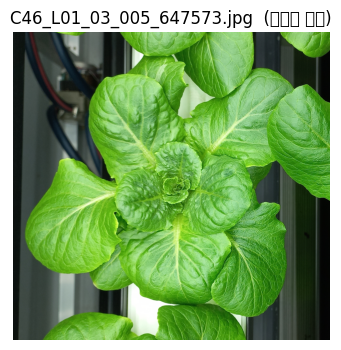

In [11]:
import random
# ── 진단: 이미지 1장에서 confidence 무시하고 raw 점수 확인 ───────────────────
assert active_detector is not None, 'Backend 셀을 먼저 실행하세요.'

_diag_row = df_all.iloc[random.randint(0, len(df_all) - 1)]
_diag_img = np.array(Image.open(_diag_row['image_path']).convert('RGB'))

_saved_conf = DETECT_CONF
DETECT_CONF = 0.001
_raw = active_detector(_diag_img)
DETECT_CONF = _saved_conf

_light_str = f"{_diag_row['light']:.0f}" if _diag_row['light'] is not None else 'N/A'
print(f'백엔드: {active_backend}')
print(f'이미지: {_diag_row["image_filename"]}  source={_diag_row["source"]}  light={_light_str}')
print(f'conf=0.001 검출 수: {len(_raw)}')

if _raw:
    scores = [d['score'] for d in _raw]
    print(f'score  max={max(scores):.4f}  mean={np.mean(scores):.4f}  min={min(scores):.4f}')
    print('\n상위 10개:')
    for d in sorted(_raw, key=lambda x: -x['score'])[:10]:
        print(f"  {d['label']:18s}  score={d['score']:.4f}")
else:
    print('⚠ 검출 없음 → 모델 로드 또는 텍스트 쿼리 문제일 수 있습니다.')

fig, ax = plt.subplots(figsize=(7, 4))
ax.imshow(_diag_img)
ax.axis('off')
ax.set_title(f'{_diag_row["image_filename"]}  (진단용 원본)')
plt.show()
plt.close(fig)

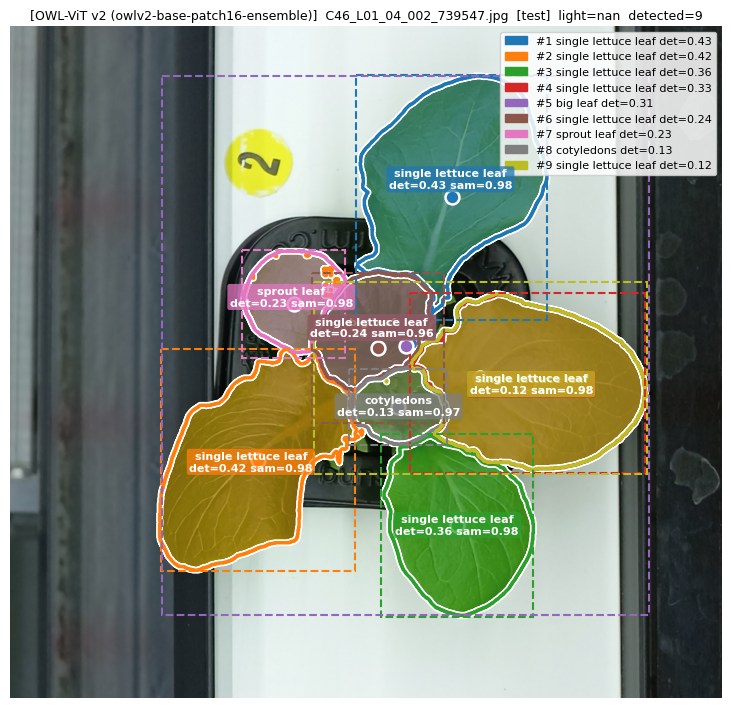

  C46_L01_04_002_739547.jpg: 9개


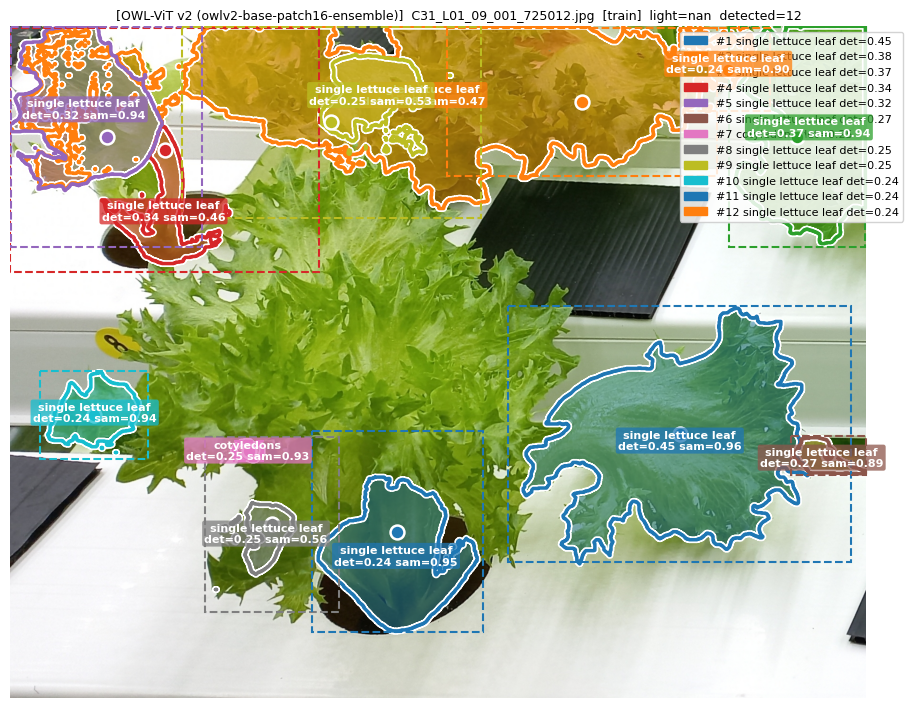

  C31_L01_09_001_725012.jpg: 12개


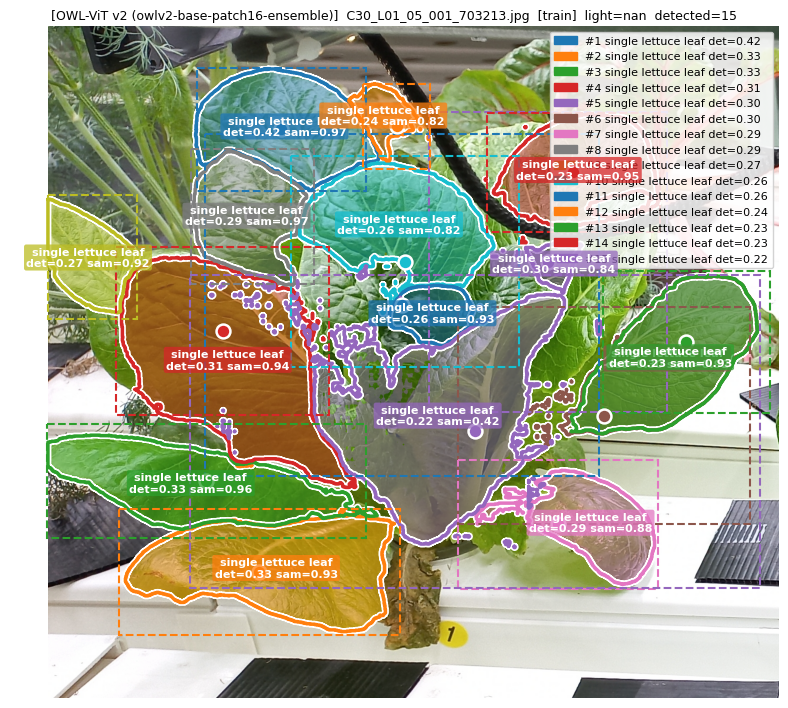

  C30_L01_05_001_703213.jpg: 15개


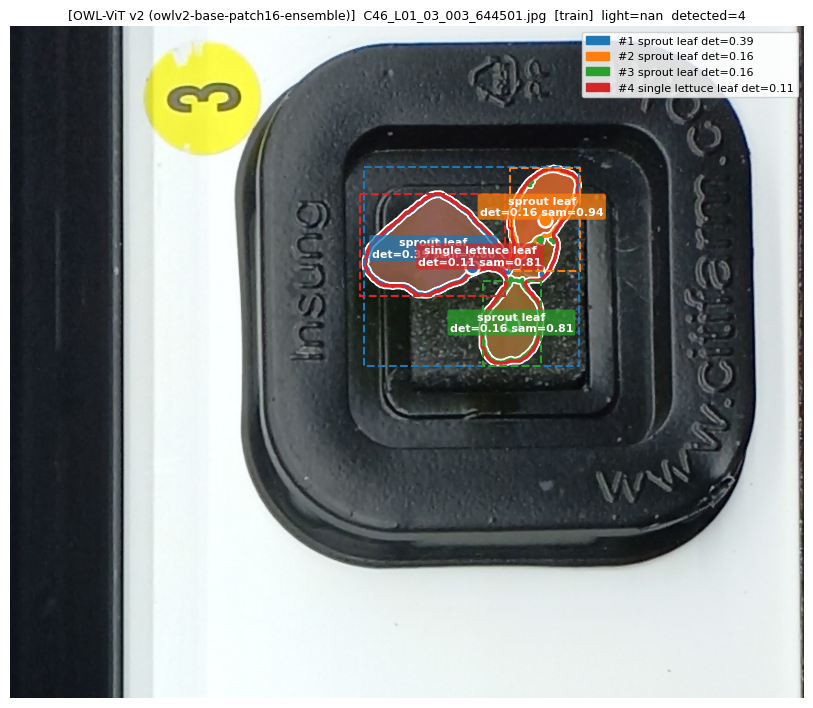

  C46_L01_03_003_644501.jpg: 4개


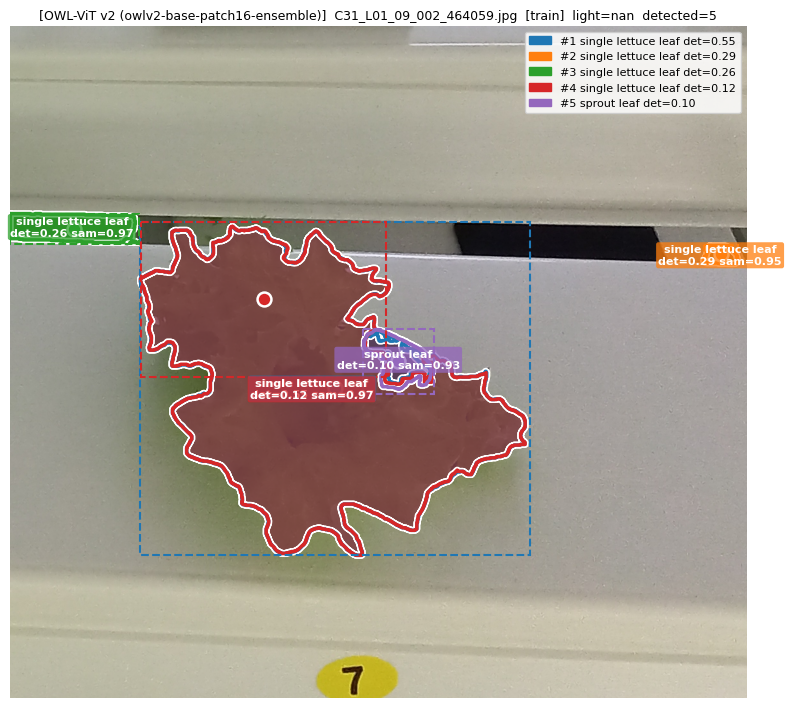

  C31_L01_09_002_464059.jpg: 5개


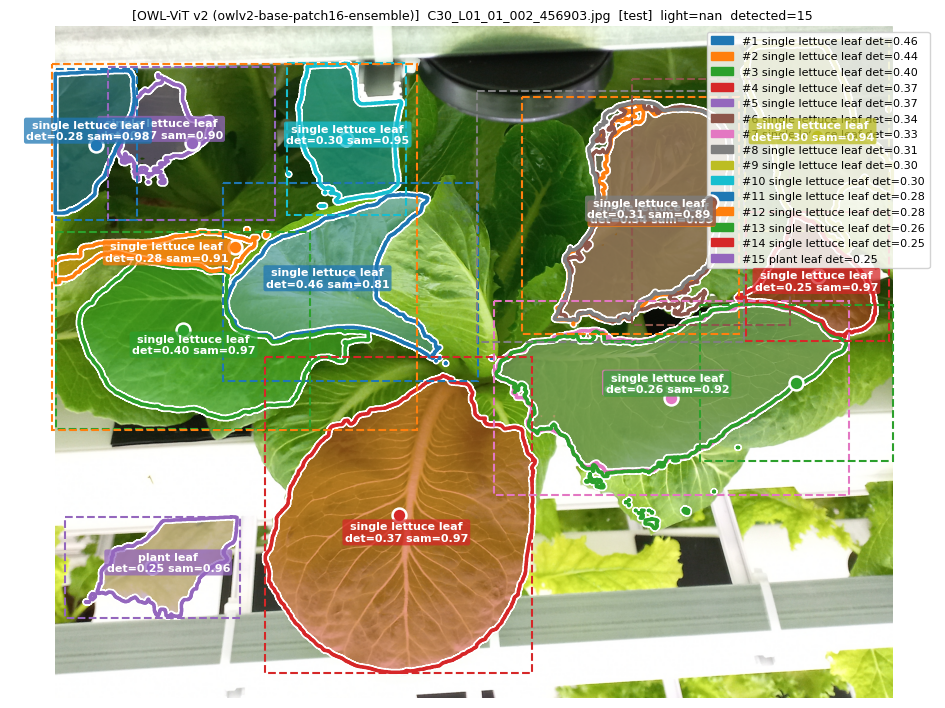

  C30_L01_01_002_456903.jpg: 15개


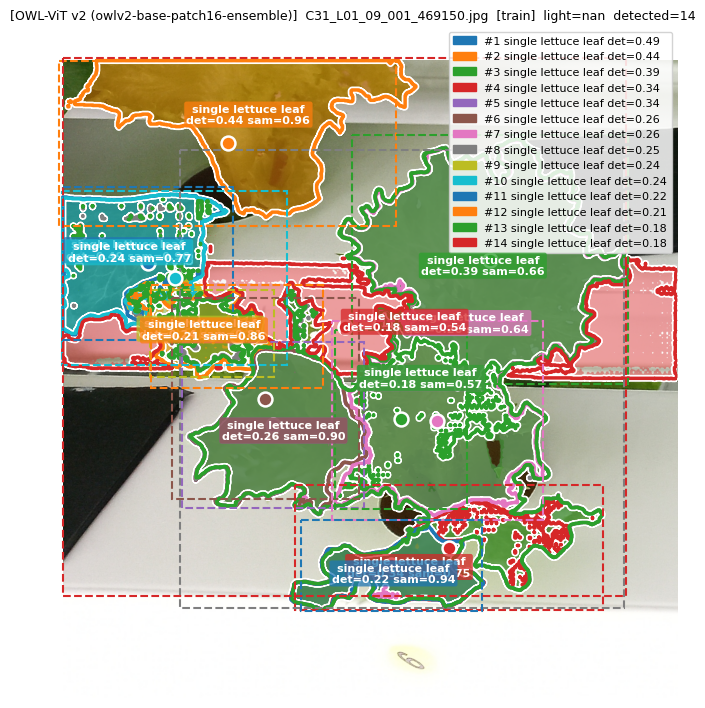

  C31_L01_09_001_469150.jpg: 14개


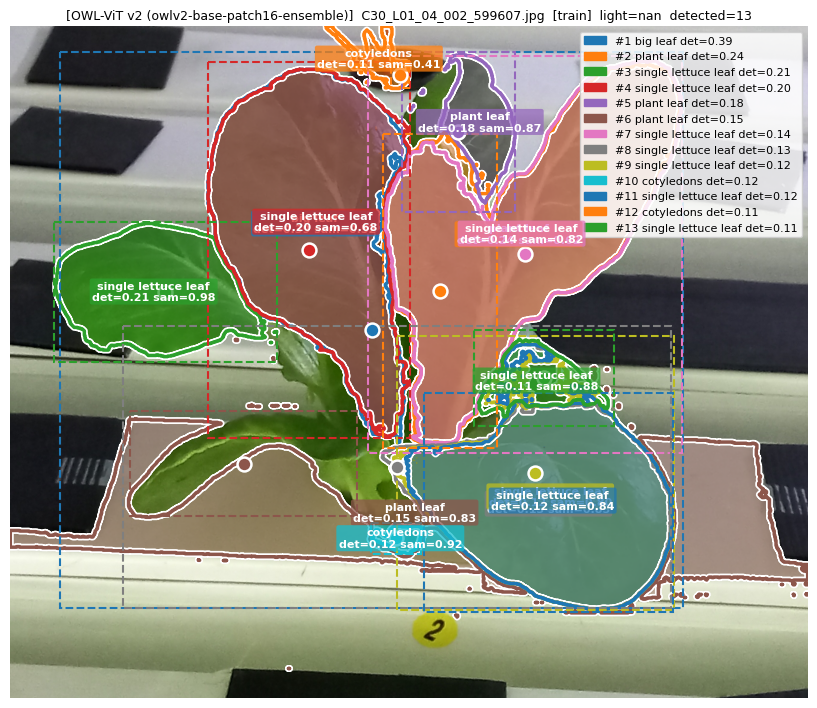

  C30_L01_04_002_599607.jpg: 13개


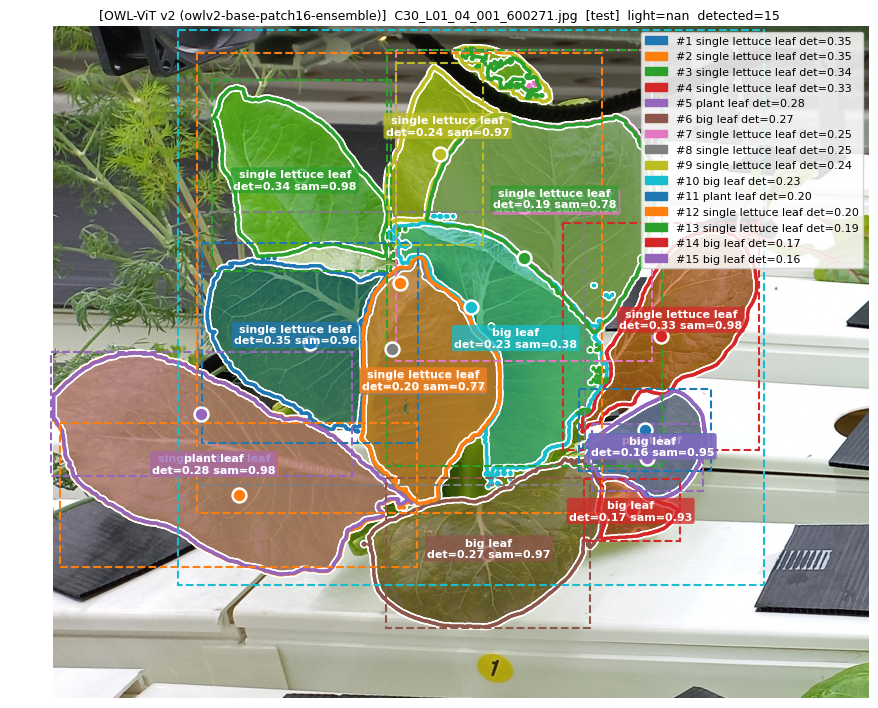

  C30_L01_04_001_600271.jpg: 15개


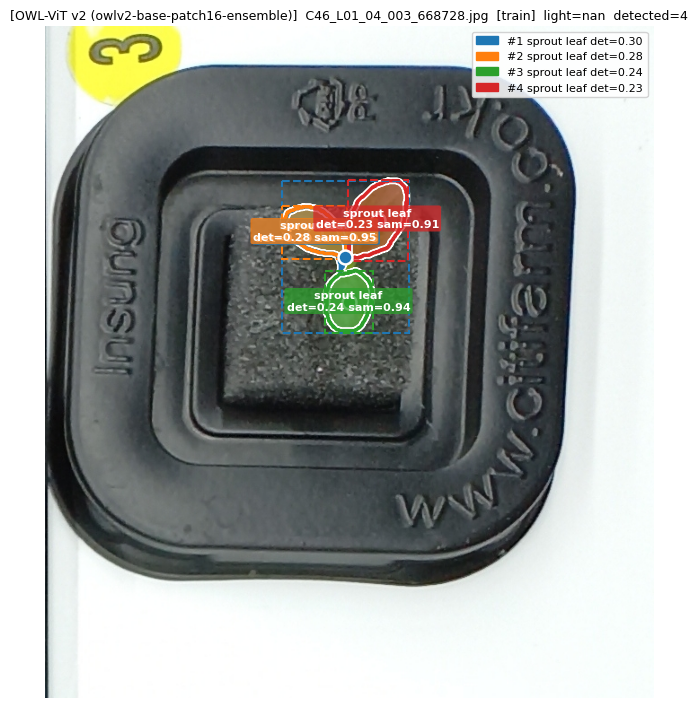

  C46_L01_04_003_668728.jpg: 4개


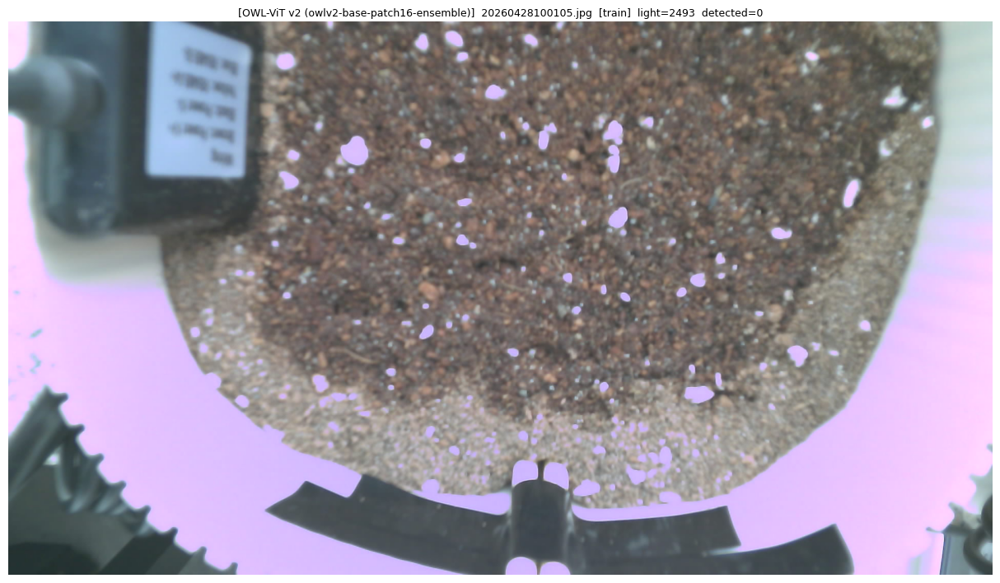

  20260428100105.jpg: 0개


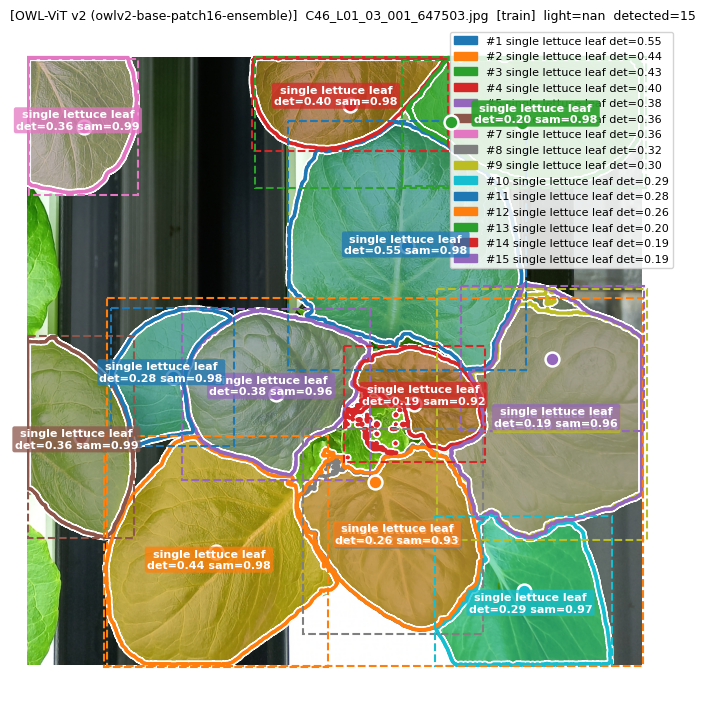

  C46_L01_03_001_647503.jpg: 15개

평균=10.1  최대=15  최소=0  0개=1장


In [12]:
N_PREVIEW   = 12
RANDOM_SEED = 42

sample_df       = df_all.sample(min(N_PREVIEW, len(df_all)), random_state=RANDOM_SEED)
preview_results = []

for _, row in sample_df.iterrows():
    image_rgb = np.array(Image.open(row['image_path']).convert('RGB'))
    instances = detect_and_segment(image_rgb)

    _light_str = f"light={row['light']:.0f}" if row['light'] is not None else 'external'
    title = (
        f"[{active_backend}]  "
        f"{row['image_filename']}  "
        f"[{row['split']}]  {_light_str}  detected={len(instances)}"
    )
    fig = visualize_result(image_rgb, instances, title=title)
    plt.show()
    plt.close(fig)

    preview_results.append({
        'image_filename': row['image_filename'],
        'n_instances'   : len(instances),
    })
    print(f"  {row['image_filename']}: {len(instances)}개")

counts = [r['n_instances'] for r in preview_results]
print(f'\n평균={np.mean(counts):.1f}  최대={max(counts)}  최소={min(counts)}  0개={sum(c==0 for c in counts)}장')

---
## 전체 저장

미리보기 품질이 만족스러우면 실행하세요.

In [13]:
TARGET_DF = df_all
OVERWRITE = True

stats = {'saved': 0, 'skipped': 0, 'empty': 0, 'error': 0}
empty_ones = []

for i, (_, row) in enumerate(TARGET_DF.iterrows()):
    img_path = row['image_path']
    lbl_path = AUTO_LABELS_DIR / f'{img_path.stem}.txt'

    if lbl_path.exists() and not OVERWRITE:
        stats['skipped'] += 1
        continue

    if (i + 1) % 50 == 0:
        print(f'[{i+1}/{len(TARGET_DF)}] {stats}')

    try:
        image_rgb = np.array(Image.open(img_path).convert('RGB'))
        instances = detect_and_segment(image_rgb)

        if not instances:
            empty_ones.append(lbl_path)
            stats['empty'] += 1
            continue

        h, w  = image_rgb.shape[:2]
        lines = [
            l for inst in instances
            if (l := mask_to_yolo_polygon(inst['mask'], h, w, inst['cls_id'])) is not None
        ]
        save_yolo_label(lbl_path, lines)
        stats['saved'] += 1

    except Exception as e:
        print(f'[오류] {img_path.name}: {e}')
        stats['error'] += 1

print('\n===== 저장 완료 =====')
for k, v in stats.items():
    print(f'  {k:8s}: {v}')
print(f'  저장 경로: {AUTO_LABELS_DIR}')

[50/14403] {'saved': 47, 'skipped': 0, 'empty': 2, 'error': 0}
[100/14403] {'saved': 66, 'skipped': 0, 'empty': 33, 'error': 0}
[150/14403] {'saved': 98, 'skipped': 0, 'empty': 51, 'error': 0}
[200/14403] {'saved': 148, 'skipped': 0, 'empty': 51, 'error': 0}
[250/14403] {'saved': 197, 'skipped': 0, 'empty': 52, 'error': 0}
[300/14403] {'saved': 215, 'skipped': 0, 'empty': 84, 'error': 0}
[350/14403] {'saved': 258, 'skipped': 0, 'empty': 91, 'error': 0}
[400/14403] {'saved': 308, 'skipped': 0, 'empty': 91, 'error': 0}
[450/14403] {'saved': 356, 'skipped': 0, 'empty': 93, 'error': 0}
[500/14403] {'saved': 406, 'skipped': 0, 'empty': 93, 'error': 0}
[550/14403] {'saved': 456, 'skipped': 0, 'empty': 93, 'error': 0}
[600/14403] {'saved': 506, 'skipped': 0, 'empty': 93, 'error': 0}
[650/14403] {'saved': 555, 'skipped': 0, 'empty': 94, 'error': 0}
[700/14403] {'saved': 605, 'skipped': 0, 'empty': 94, 'error': 0}
[750/14403] {'saved': 655, 'skipped': 0, 'empty': 94, 'error': 0}
[800/14403] {'s

In [15]:
import math
#clear everything first
print(f"clearing empty ones first: {len(empty_ones)}")
for empty_lbl_path in empty_ones:
    try:
        os.unlink(empty_lbl_path)
    except:
        pass
        
#attmpt generate empty label to about 5% of the non-empty ones
select_empty = min(math.floor(stats['saved'] * 0.05), len(empty_ones))
print(f"selecting empty datasets: {select_empty}")

clearing empty ones first: 1657
selecting empty datasets: 637


In [18]:
empty_lbl_paths = random.sample(sorted(empty_lbl_paths), k=select_empty)
#failsafe for empty might not be that many(although it won't be the case)

for empty_lbl_path in empty_lbl_paths:
    empty_lbl_path.write_text('')
    save_yolo_label(lbl_path, [])

### 손상된 이미지(opencv) 제거 및 split별로 label, photo 복사 

In [22]:
import shutil, tempfile

# ── stem → row 매핑 ──────────────────────────────────────────────────────────
stem_to_row = {row['image_path'].stem: row for _, row in df_all.iterrows()}

# ── dataset2 디렉터리 구조 생성 ───────────────────────────────────────────────
splits        = ['train', 'val', 'test']
discarded_dir = DATASET_DIR / 'discarded'
for s in splits:
    (DATASET_DIR / s / 'images').mkdir(parents=True, exist_ok=True)
    (DATASET_DIR / s / 'labels').mkdir(parents=True, exist_ok=True)
discarded_dir.mkdir(parents=True, exist_ok=True)

# ── OpenCV 손상 검사 ──────────────────────────────────────────────────────────
def is_valid_image(img_path: Path) -> bool:
    """libjpeg C-level stderr를 캡처해 Corrupt JPEG 감지"""
    tmp_fd, tmp_name = tempfile.mkstemp()
    saved_fd = os.dup(2)
    try:
        os.dup2(tmp_fd, 2)
        img_cv = cv2.imread(str(img_path), cv2.IMREAD_COLOR)
    finally:
        os.dup2(saved_fd, 2)
        os.close(saved_fd)
        os.close(tmp_fd)
    try:
        with open(tmp_name, 'r', errors='ignore') as f:
            cv_stderr = f.read()
        os.unlink(tmp_name)
    except Exception:
        cv_stderr = ''
    return not ('Corrupt JPEG' in cv_stderr or img_cv is None or img_cv.size == 0)

# ── 라벨 기준 복사 (OpenCV 검사 포함) ────────────────────────────────────────
all_txts = sorted(AUTO_LABELS_DIR.glob('*.txt'))

n_copied   = {s: 0 for s in splits}
n_corrupt  = 0
n_no_match = 0

for txt_path in all_txts:
    stem = txt_path.stem
    row  = stem_to_row.get(stem)
    if row is None:
        n_no_match += 1
        continue

    img_src = row['image_path']

    if not is_valid_image(img_src):
        shutil.copy2(img_src, discarded_dir / img_src.name)
        n_corrupt += 1
        continue

    split   = row['split']
    img_dst = DATASET_DIR / split / 'images' / img_src.name
    lbl_dst = DATASET_DIR / split / 'labels' / txt_path.name

    if not img_dst.exists():
        shutil.copy2(img_src, img_dst)
    if not lbl_dst.exists():
        shutil.copy2(txt_path, lbl_dst)

    n_copied[split] += 1

print('===== 복사 완료 (OpenCV 검증 포함) =====')
for s in splits:
    img_cnt = len(list((DATASET_DIR / s / 'images').glob('*')))
    lbl_cnt = len(list((DATASET_DIR / s / 'labels').glob('*')))
    print(f'  {s:5s}: 복사 {n_copied[s]}개  images={img_cnt}  labels={lbl_cnt}')
print(f'  손상 이미지: {n_corrupt}개 → {discarded_dir}')
if n_no_match:
    print(f'  df_all 미매칭 스킵: {n_no_match}개')

ERROR:asyncio:Task was destroyed but it is pending!
task: <Task pending name='Task-123' coro=<_async_in_context.<locals>.run_in_context() done, defined at /Users/mainframe/Workspace/Graduates/planta-gochi-ML/.venv/lib/python3.13/site-packages/ipykernel/utils.py:57> wait_for=<Task pending name='Task-124' coro=<Kernel.shell_main() running at /Users/mainframe/Workspace/Graduates/planta-gochi-ML/.venv/lib/python3.13/site-packages/ipykernel/kernelbase.py:597> cb=[Task.task_wakeup()]> cb=[ZMQStream._run_callback.<locals>._log_error() at /Users/mainframe/Workspace/Graduates/planta-gochi-ML/.venv/lib/python3.13/site-packages/zmq/eventloop/zmqstream.py:563]>
ERROR:asyncio:Task was destroyed but it is pending!
task: <Task pending name='Task-124' coro=<Kernel.shell_main() running at /Users/mainframe/Workspace/Graduates/planta-gochi-ML/.venv/lib/python3.13/site-packages/ipykernel/kernelbase.py:597> cb=[Task.task_wakeup()]>


===== 복사 완료 (OpenCV 검증 포함) =====
  train: 복사 10682개  images=10682  labels=10682
  val  : 복사 1340개  images=1340  labels=1340
  test : 복사 1353개  images=1353  labels=1353
  손상 이미지: 7개 → /Users/mainframe/Workspace/Graduates/planta-gochi-ML/dataset2/collector/discarded


In [23]:
# is_valid_image 및 복사 로직은 위 "이미지 split/label로 복사" 셀에서 처리됨
# 아래 셀은 복사 후 split 디렉터리의 최종 상태를 확인합니다
import warnings as _w

print('=== dataset2 최종 현황 ===')
for s in splits:
    img_cnt = len(list((DATASET_DIR / s / 'images').glob('*')))
    lbl_cnt = len(list((DATASET_DIR / s / 'labels').glob('*')))
    print(f'  {s:5s}: images={img_cnt}  labels={lbl_cnt}')

# stem_to_row, splits, all_txts 는 위 "이미지 split/label로 복사" 셀에서 정의됨
nonempty = [t for t in all_txts if t.stat().st_size > 0]
empty    = [t for t in all_txts if t.stat().st_size == 0]

print(f'AUTO_LABELS_DIR 라벨 현황:')
print(f'  있음: {len(nonempty)}')
print(f'  빈것: {len(empty)}')
print(f'  합계: {len(all_txts)}')

=== dataset2 최종 현황 ===
  train: images=10682  labels=10682
  val  : images=1340  labels=1340
  test : images=1353  labels=1353
AUTO_LABELS_DIR 라벨 현황:
  있음: 12745
  빈것: 637
  합계: 13382


### 라벨 생성 결과 확인

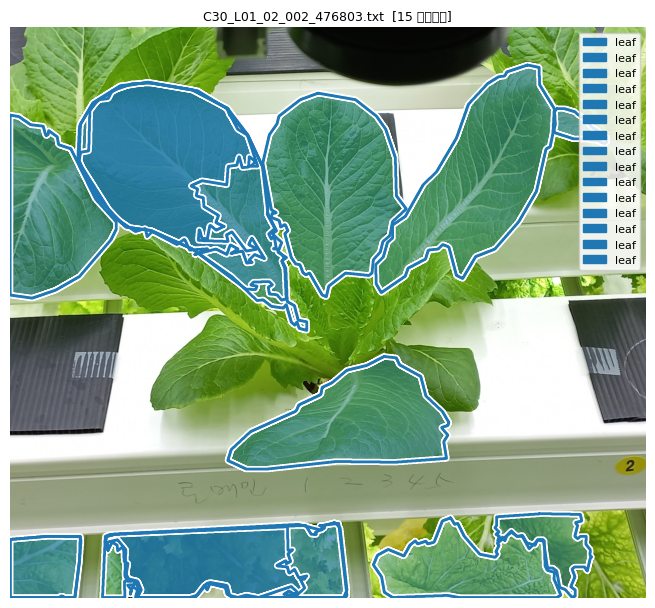

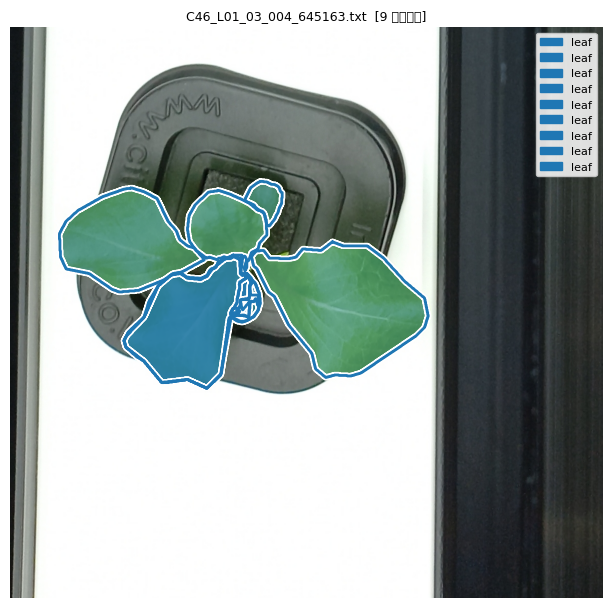

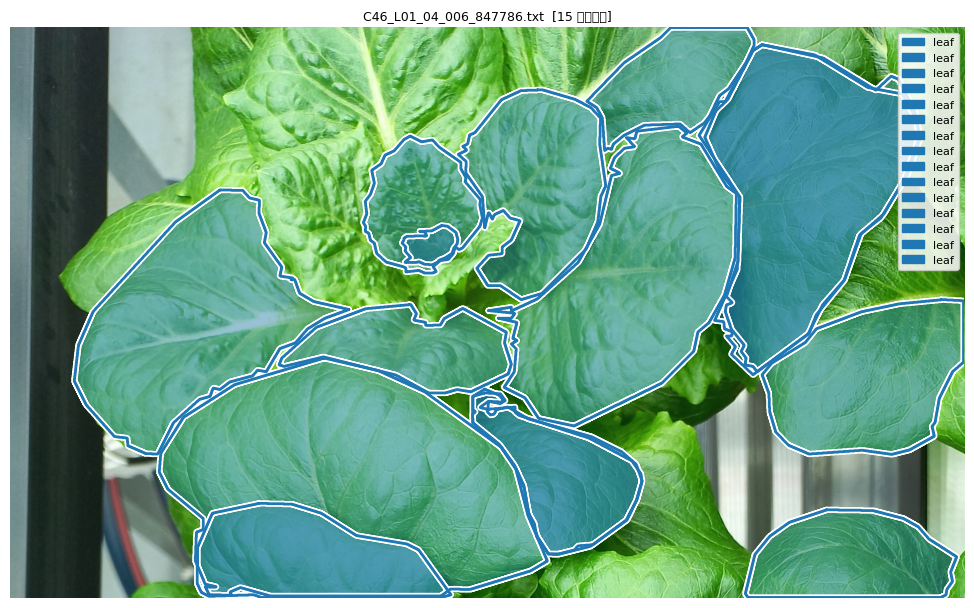

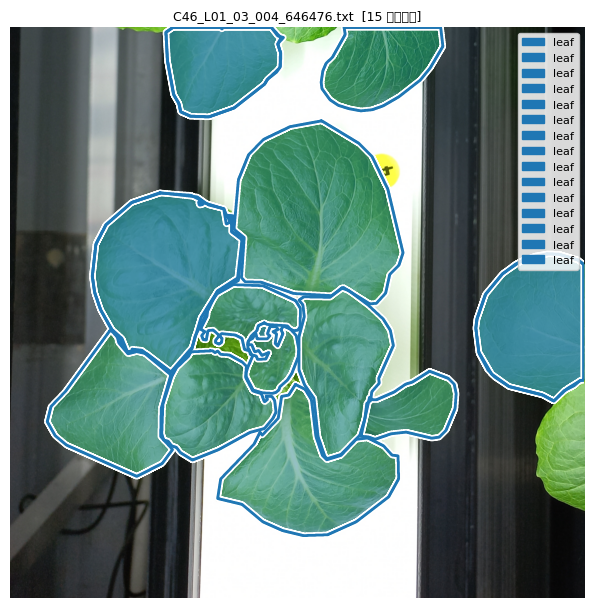

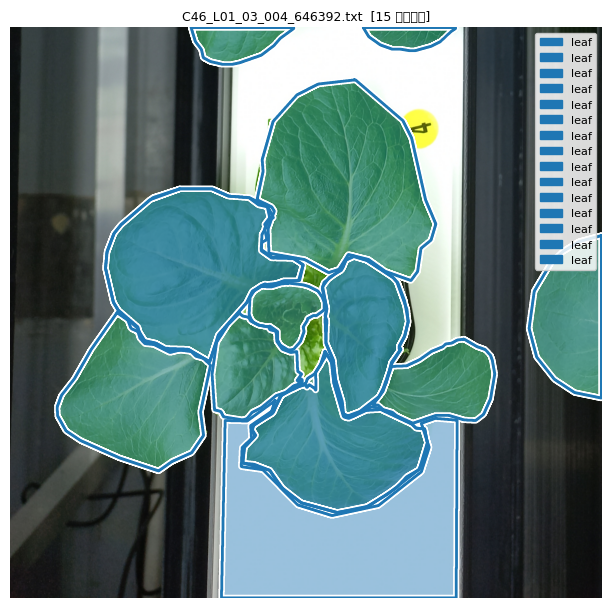

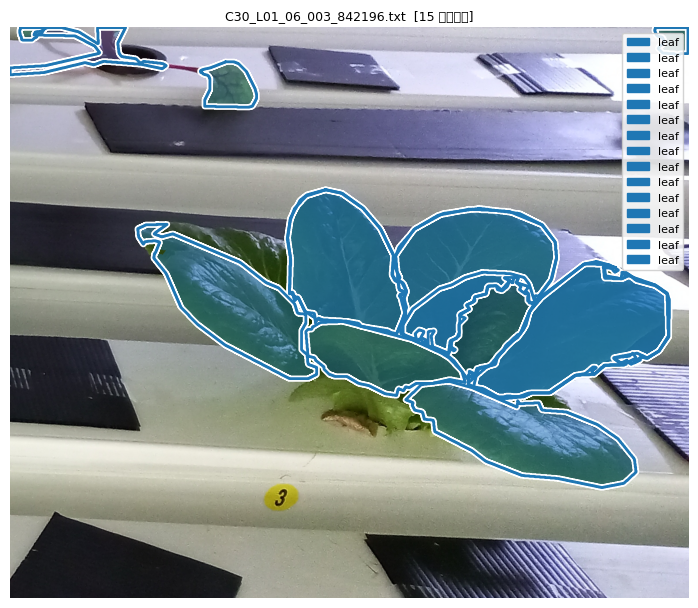

In [24]:
# 저장된 라벨 재확인 시각화 (무작위 6장)
import random

def draw_yolo_seg_label(image_rgb, label_path, class_names=None, figsize=(10, 6), title=''):
    h, w = image_rgb.shape[:2]
    display_img = image_rgb.copy()
    polygons = []

    content = label_path.read_text().strip()
    if not content:
        fig, ax = plt.subplots(figsize=figsize)
        ax.imshow(display_img)
        ax.set_title(f'{title}  [라벨 없음]', fontsize=9)
        ax.axis('off')
        return fig

    for line in content.splitlines():
        parts  = line.strip().split()
        cls_id = int(parts[0])
        pts_px = (np.array(parts[1:], dtype=float).reshape(-1, 2)
                  * np.array([w, h])).astype(np.int32)
        mask = np.zeros((h, w), dtype=np.uint8)
        cv2.fillPoly(mask, [pts_px], 1)
        color = COLORS[cls_id % len(COLORS)]
        display_img = blend_mask(display_img, mask.astype(bool), color)
        polygons.append({'cls_id': cls_id, 'mask': mask.astype(bool), 'color': color})

    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(display_img)
    ax.axis('off')
    for p in polygons:
        draw_contour_halo(ax, p['mask'], p['color'], lw=2.0)

    cnames = class_names or []
    patches = [
        mpatches.Patch(color=p['color'],
                       label=cnames[p['cls_id']] if p['cls_id'] < len(cnames) else f"cls {p['cls_id']}")
        for p in polygons
    ]
    if patches:
        ax.legend(handles=patches, loc='upper right', fontsize=8, framealpha=0.85)
    ax.set_title(f'{title}  [{len(polygons)} 인스턴스]', fontsize=9)
    fig.tight_layout(pad=0.4)
    return fig


label_files  = [p for p in AUTO_LABELS_DIR.glob('*.txt') if p.stat().st_size > 0]
recheck_list = random.sample(label_files, min(6, len(label_files)))

for lbl_path in recheck_list:
    candidates = [p for p in ROOT.rglob(f'*{lbl_path.stem}*')
                  if p.suffix.lower() in {'.jpg', '.jpeg', '.png'}]
    if not candidates:
        continue
    image_rgb = np.array(Image.open(candidates[0]).convert('RGB'))
    fig = draw_yolo_seg_label(image_rgb, lbl_path,
                               class_names=['leaf', 'stem'],
                               title=lbl_path.name)
    plt.show()
    plt.close(fig)